## Analog and digital transmissions
### 2023 M1 E.E.A. MISTRE

# Labwork : SDR analysis on real world radio FM broadcasting  

### Travail a fait par Vasilii Kulagin

---

### _Preliminary work : GnuRadio_

Start Ubuntu 18.04 on your station, run `gnuradio_companion` and reproduce this flowgraph. Explain the whole system and the role of each block.

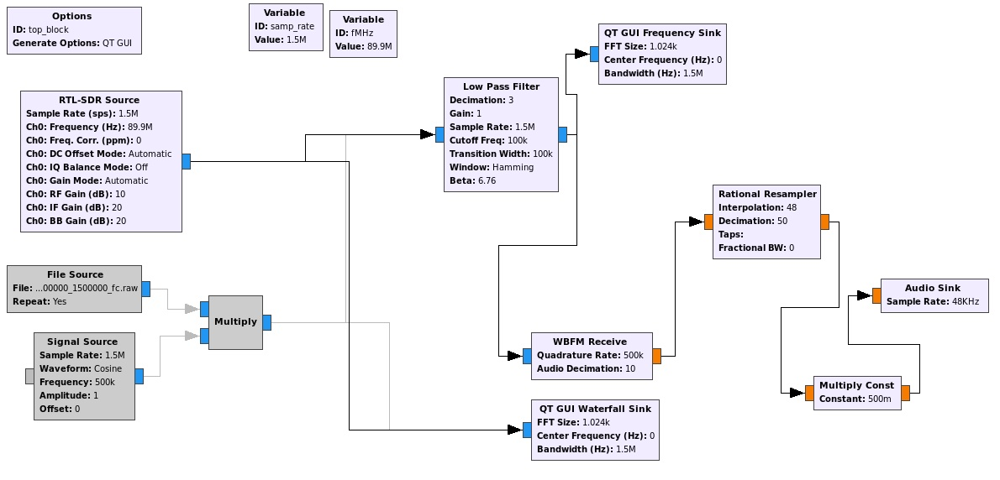

### _Actual labwork : Full demodulation of FM signal_

In this laboratory work, you will record a real IQ stream from a FM station using GQRX. Then, you will proceed to a complete signal analysis in order to get :
- a monophonic signal (analog)
- a stereophonic signal (analog, too)
- digital informations from the RDS substream.

Ressources :
- https://en.wikipedia.org/wiki/Software-defined_radio
- https://en.wikipedia.org/wiki/FM_broadcasting
- https://en.wikipedia.org/wiki/Radio_Data_System
- https://pysdr.org/index.html

En utilisant le programme `gnuradio_companion`, nous avons reproduit le schéma ci-dessus en changeant les paramètres pour notre cas : nous avons changé le taux d'échantillonnage ainsi que la fréquence

![gnu_radio.png](images/gnu_radio.png)

Dans ce schéma, nous voyons qu'il y a deux possibilités pour la récupération du signal :  
- Récupérer le signal directement à partir de l'antenne (avec RTL-SDR)
- Utilisation d'un signal déjà enregistré (partie grise - désactivée)  

Si nous suivons le chemin parcouru par le signal, nous constatons que :
- Le signal d'origine est utilisé pour visualiser le "waterfall" (spectrogramme)
- Le signal d'origine est filtré par un filtre passe-bas avec une fréquence de coupure de 100 kHz
    - Le signal filtré est utilisé pour visualiser sa densité spectrale de puissance : largeur de bande du signal - 960 kHz, frequénce centrale - 0 Hz
    - Après le filtrage, nous démodulons le signal de diffusion FM. Pour obtenir le son, il faut réduire le débit du canal d'un facteur 10. Il est important de noter que en sortie nous obtenons les données de type 'float' (rectangle orange sur le schéma)
        - Appliquer un filtre RIF à un signal démodulé avec un facteur d'interpolation de 48, un facteur de décimation de 50 et une largeur de bande fractionnelle de 0
            - Multiplier le signal résultant par une constante, qui est le contrôle du volume.
                - Recevoir un signal qui peut être lu par les haut-parleurs ou un autre appareil audio


Par la suite, nous effectuerons toutes les étapes ci-dessus en implémentant le code en Python

---

## Capturing a IQ stream.

Take some minutes to plug your Sofware-defined radio dongle and play with GQRX.

Intructions :

- observe the FM bandwidth : stations footprint, listen to some radios, consider RDS data...
- explore the electromagnetic spectrum : which frequencies are accessibles? can you see (or listen) some other signals? GSM? BT? planes?
- choose a FM radio station you like (with a good signal strength and a valid RDS message, please!) and capture 30s at a 960Ms/s.


Ressources :
- https://gqrx.dk/
- https://pysdr.org/content/iq_files.html
- https://www.rtl-sdr.com/about-rtl-sdr/


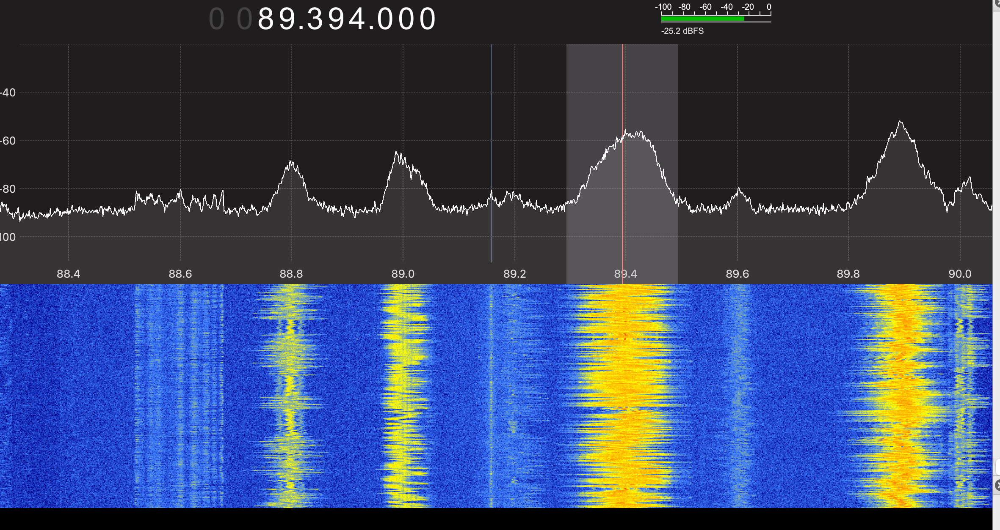

En observant le spectre électromagnétique, nous voyons de nombreux pics avec un "waterfall" coloré, comme le montre la figure ci-dessus. Cela correspond aux stations de radio FM.  
Nous pouvons également voir ce qui se passe sur les fréquences d'autres signaux :   
- GSM (frequence de 900 MHz) : nous observons des raies qui apparaissent parfois
- avions (~180 MHz) : nous ne voyons rien de spécial, juste quelques signaux porteurs inconnus. En effet, comme nous sommes assez éloignés des avions (et des aéroports), il est logique que nous ne puissions rien observer.

Dans les configurations, nous avons choisi notre dispositif RTL : Realtek RTL2838UHIDIR SN:00000001, et le taux d'échantillonnage : 960 kHz (960_000 échantillons par seconde).  
Nous avons choisi une station de radio centrée sur 94.5 MHz pour enregistrer le signal. Avant l'enregistrement, nous avons réduit le gain pour mieux analyser le résultat dans l'exercice suivant. Nous avons enregistré ~30 secondes d'émission 

Dans le bloc ci-dessous, nous importons les bibliothèques nécessaires et définissons les paramètres de la visualisation des images.

In [1]:
# general imports
import numpy as np
π = np.pi

from scipy.signal import resample_poly, firwin, bilinear, lfilter

from libADTrans import showPSD, showWaterfall, showPSD_FMdemodulated
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)

Let's open you .raw file and see what it looks like.

[ 0.00468749-0.02656251j -0.01875001-0.01093751j -0.00312501-0.01093751j
 ...  0.01249999-0.01093751j  0.02031249+0.01249999j
  0.01249999-0.01093751j]


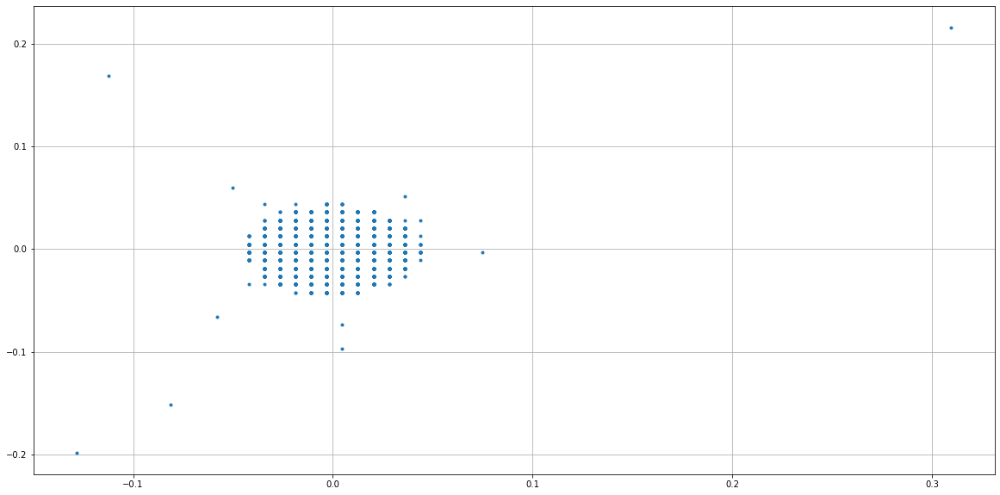

In [2]:
# Le fichier contienant des informations reçues directement de l'ADC
file = 'stan_945.raw' 

# Construire un tableau de type complex64 à partir de données dans un fichier binaire
# En utilisant le type de données "complex64", nous spécifions que chaque nombre est représenté sur 8 bits :
# 4 bits pour la partie réelle et 4 bits pour la partie imaginaire
samples = np.fromfile(file, np.complex64) 
print(samples)

# visualiser les données en utilisant la valeur de l'amplitude I sur l'axe des x et de l'amplitude Q sur l'axe des y
plt.plot(np.real(samples), np.imag(samples), '.')
plt.grid(True)
plt.show()

- Can you describe the data (the `samples`array) that we are about to work with? Size, type, discretization, etc? 

Dans l'image ci-dessus, nous voyons les données récupérées à partir d'un fichier .raw. Nous avons représenté les données de telle sorte que la partie réelle (amplitude I) se trouve sur l'axe des x et la partie imaginaire (amplitude Q) sur l'axe des y où :  
- La composante I représente l'amplitude du signal à la fréquence de la porteuse.
- La composante Q représente l'amplitude du signal à la fréquence déphasée de 90 degrés par rapport à la fréquence porteuse. 

Afin de savoir la taille de donées nous utilisons la commande suivante : 

In [3]:
samples.size

29499747

Nous pouvons également vérifier la durée du signal enregistré :

In [4]:
samples.size/960e3

30.728903125

Comme mentionné précédemment, nous avons indiqué que nous voulions recevoir des données de type `complex64`, nous pouvons voir que c'est le cas

In [5]:
type(samples[0])

numpy.complex64

Pour connaître la résolution du signal, nous pouvons calculer le logarithme en base 2 du nombre d'amplitudes obtenues :

In [6]:
np.log2(19)

4.247927513443585

Nous devrions obtenir un résultat équivalent à une puissance de 2. Comme le résultat est supérieur à 4, nous pouvons dire que la résolution du signal est de 8 bits. Nous le confirmons en consultant la documentation de RTL-SDR (section "What is the RTL-SDR's ADC resolution?") :  
`The native resolution is 8 bits, but the Effective Number of Bits (ENOB) is estimated at ~7. Decimation in software may raise this value`

--- 
## Signal visualization and preparation

Let's introduce some helper function to be used in a jupyter notebook.
- `showPSD(samples, sample_rate, center_freq)` displays the power spectral distribution (time integrated)
- `showWaterfall(samples, sample_rate, center_freq)` display a colorfull waterfall...



In [7]:
sample_rate = 960e3 # le taux d'échantillonnage
center_freq = 94.5e6 # frequence centrale du sigbnal récuperé

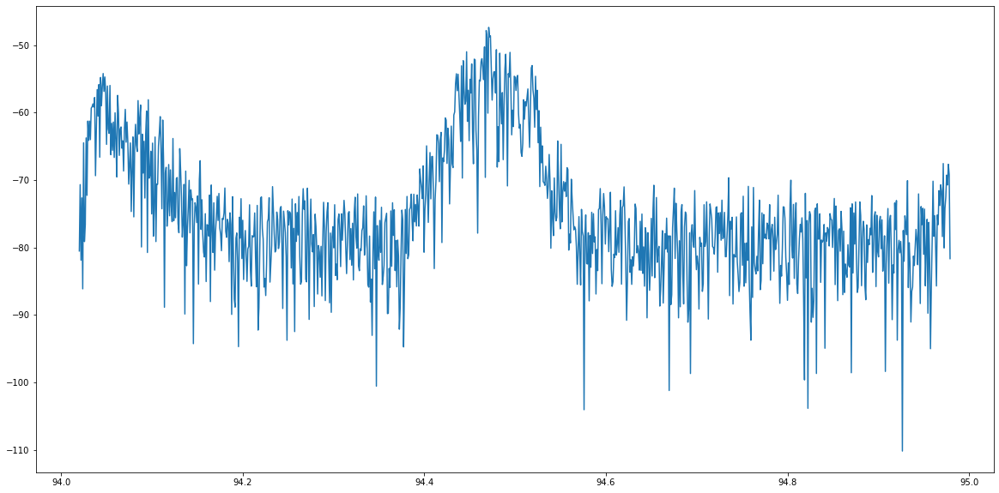

In [8]:
showPSD(samples, sample_rate, center_freq)

PSD - Densitée spectrale de puissance (power spectral distribution), elle représente la répartition fréquentille de la puissance d'un signal suivant les fréquences qui le composent

- `showPSD(samples, sample_rate, center_freq)` : cette fonction prend nos données, le taux d'échantillonnage et la fréquence centrale comme paramètres.  
Si nous examinons le contenu, nous voyons qu'elle prend le carrée de la valeur absolue de la FFT de données fournies afin d'avoir la densitée spectrale de puissance. Ensuit nous visualisons la DSP en décibels sur la bande de fréquence calculée.

Sur l'image obtenue nous voyons bien nos données récupérées à partir de la sation à 94.5 MHz. Nous constatons que nous avons également enregistré des données provenant de stations radio voisines (94.1 MHz et 95 MHz).

C:\Users\Vasily\STAN\libADTrans.py:32: RuntimeWarning: divide by zero encountered in log10
  spectrogram[i,:] = 10*np.log10(np.abs(np.fft.fftshift(np.fft.fft(x[i*fft_size:(i+1)*fft_size])))**2)


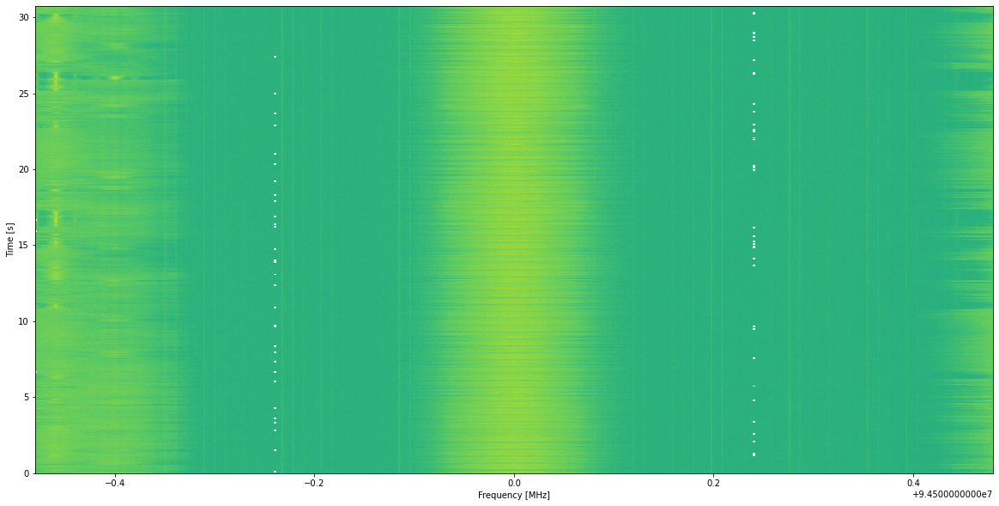

In [9]:
showWaterfall(samples, sample_rate, center_freq)

- `showWaterfall(samples, sample_rate, center_freq)` : cette fonction prend nos données, le taux d'échantillonnage et la fréquence centrale comme paramètres. Cette fonction crée un spectrogramme d'un signal donné (la fréquence en fonction du temps). 

Sur l'image obtenue nous observons bien le flux de données provenant de la station souhaitée ainsi que les données provenant des stations voisines.

__Instructions__

- What is a PSD? What does it represent? 
- read and understand these two helper functions
- use them with our signal

Do you see the radio station you have chosen on GQRX?   
__Reponse__ :
Oui, nous la voyons

Is this station aligned to the signal center frequency? If not, don't worry at all, just do that :

```
Δf = center_freq-89.9e6 # France Inter radio is a 89.9MHz
t = np.arange(len(samples))/sample_rate 
x_shifted = samples * np.exp(2j*π*Δf*t) 
```

__Instructions__

- Can you explain that trick ? (oh yes you can)

In [10]:
t = np.arange(len(samples))/960e3
t

array([0.00000000e+00, 1.04166667e-06, 2.08333333e-06, ...,
       3.07289000e+01, 3.07289010e+01, 3.07289021e+01])

Afin d'aligner la station sur la fréquence centrale du signal il faut :
- déterminer la différence de fréquence entre la fréquence centrale et la fréquence de la station de radio
- créer un axe de temps t où chaque valeur de temps correspond au centre de l'échantillon correspondant (de 0 à 30.7 secondes)
- multiplier les données par l'exposant avec la différence de fréquence et de temps trouvés (ce qui correspond au déphasage) pour obtenir le décalage de fréquence.

In [11]:
x_shifted = samples

---

## Signal filtering and FM-demodulation

Our chosen FM radio station in now centered. Before FM-demodulating the signal, it's always better to apply a filter to isolate our station from the adjacent ones.

__Instructions__

- regarding the FM radiobroadcasting conventions (in France at least), which cutoff frequency we should use?


Afin d'isoler notre station de radio de ses voisins et d'obtenir un résultat pertinent, nous appliquons un filtre passe-bas

En regardant la norme de diffusion radio FM est basée sur l'OIRT, nous constatons que la bande de fréquences maximale occupée par une station est de 200 kHz (100 kHz de part et d'autre de la fréquence centrale).   
Compte tenu de la marge de sécurité, nous choisissons 75 kHz comme fréquence de coupure

In [12]:
cutoff = 75e3 # fréquence de coupure

We choose a 5th order low-pass Butterworth filter. The scipy.signal library will help us :

In [13]:
from scipy.signal import butter, lfilter, freqz

In [14]:
order = 5
b, a = butter(order, cutoff, fs=sample_rate, btype='low', analog=False)

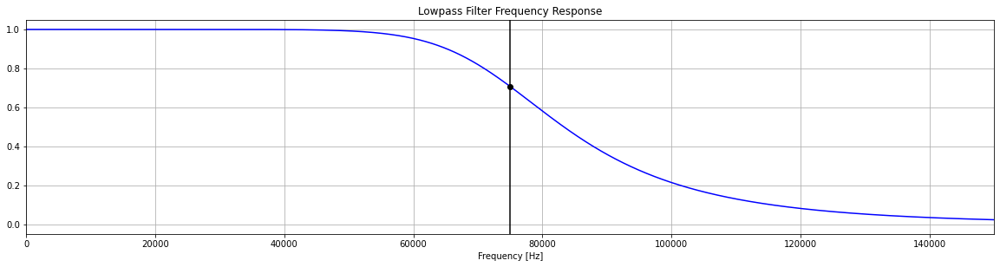

In [15]:
# Plot the frequency response.
w, h = freqz(b, a, fs=sample_rate, worN=8000)
plt.subplot(2, 1, 1)
plt.plot(w, np.abs(h), 'b')
plt.plot(cutoff, 0.5*np.sqrt(2), 'ko')
plt.axvline(cutoff, color='k')
plt.xlim(0, 2*cutoff)
plt.title("Lowpass Filter Frequency Response")
plt.xlabel('Frequency [Hz]')
plt.grid()


Sur l'image au-dessus nous voyons bien le filtre utilisé avec la fréquence de coupure de 75 kHz  
Nous appliquons ensuit ce filtre au signal, afin d'obtenir le signal filtré `x_cut`

In [16]:
x_cut = lfilter(b, a, x_shifted) # obtenir le signal filtré

__Instructions__

- display waterfall and see the difference between `x_shifted `and `x_cut`

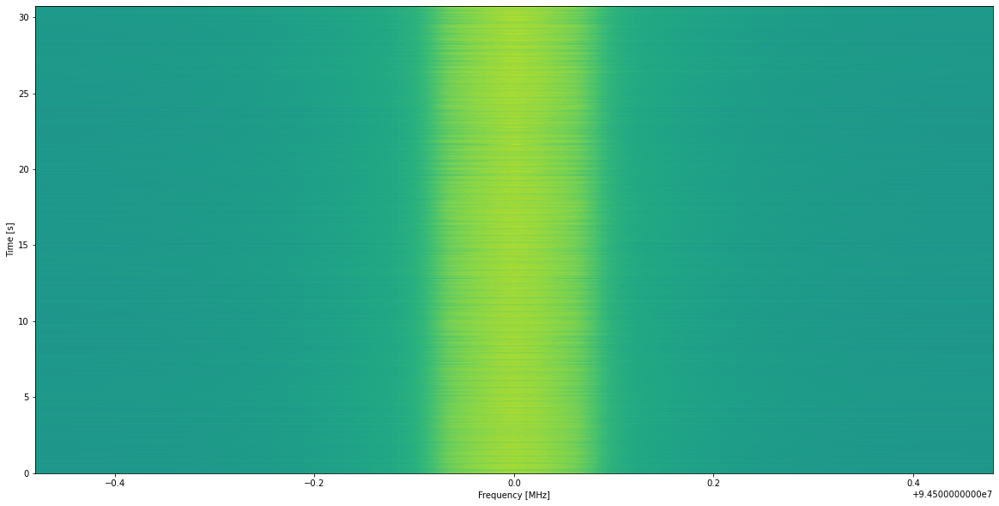

In [17]:
showWaterfall(x_cut, sample_rate, center_freq)

Lorsque nous regardons à nouveau le flux de données, nous constatons que le signal est beaucoup plus propre. Nous ne voyons plus les stations voisines. Notre signal est très bien filtré.

It's now time to FM-demodulate !

__Intructions__

- Quadrature demodulation only requires one line! explain why.

In [18]:
x_FMdemodulated = np.angle(x_cut[0:-1] * np.conj(x_cut[1:])) # see https://wiki.gnuradio.org/index.php/Quadrature_Demod

Si nous étudions la documentation fournie (Quadrature Demod en GNU Radio), nous constatons qu'il est possible de faire la modulation avec la formule suivante : $y[n] = arg(x[n]\overline{x}[n-1])$   
- x_cut[0:-1] correspond à x[n]
- np.conj(x_cut[1:]) correspond à conjugé de x[n-1] (nous commençons pas 1 et pas par 0)  
- np.angle : renvoie l'angle de l'argument complexe

Pour mieux comprendre, nous pouvons consulter les étapes détaillées:
![gnu_demod.png](images/gnu_demod.png)

We introduce a new helper function dedicated to demodulated signal. 

__Instructions :__
- using this function the way it's given, describe _precisely_ what you observe.




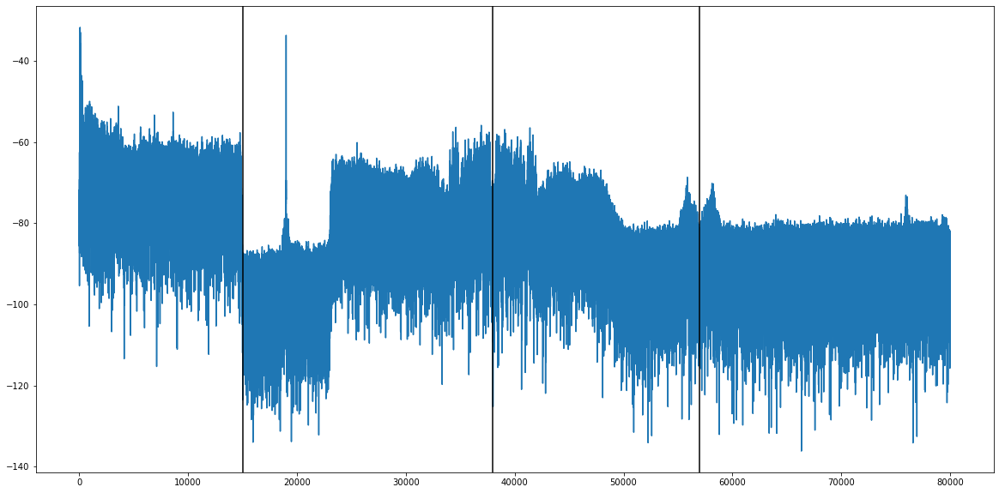

In [19]:
showPSD_FMdemodulated(x_FMdemodulated, sample_rate, axvlines=[15e3, 38e3, 57e3])

En examinant le résultat obtenu, nous consatatons que nous voyons le spectre d'une émission de radiodiffusion FM : 
- L'audio mono : le signal « G + D » entre 30 Hz et 15 kHz
- Le signal pilote de 19 kHz
- L'audio stéréo : le signal « G – D » de 23 kHz à 53 kHz avec la sous-porteuse soupprimée à 38 kHz
- le signal RDS : deux bandes latérales autour de la sous-porteuse à 57 kHz

<div>
<img src="images/radiodiffusion_FM.svg" width="400"/>
</div>

numeric - RDS

__Instructions__

- evaluate how is was important to filter the FM station before demodulation

Cette fois-ci, nous démodulons le signal non filtré pour voir la différence entre les signaux filtrés et non filtrés.

In [20]:
x_FMdemodulated_nf = np.angle(x_shifted[0:-1] * np.conj(x_shifted[1:]))

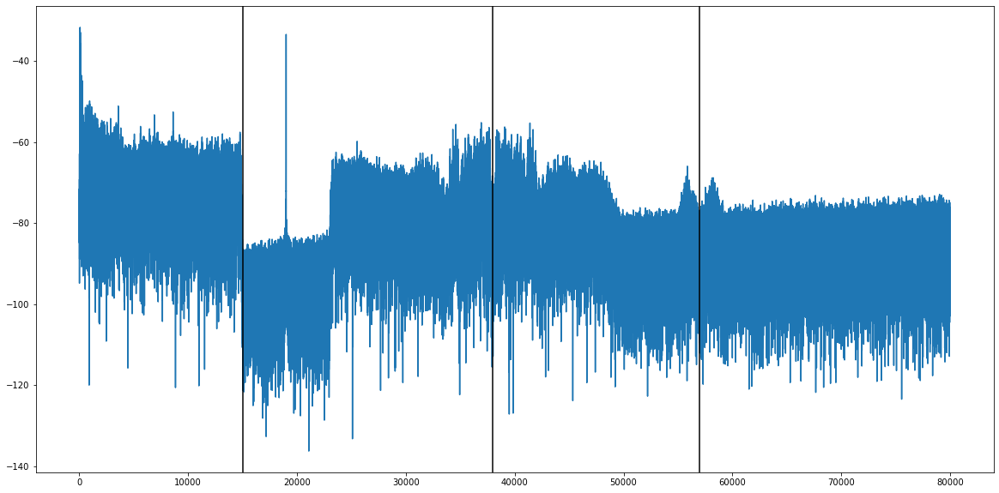

In [21]:
showPSD_FMdemodulated(x_FMdemodulated_nf, sample_rate, axvlines=[15e3, 38e3, 57e3])

En observant attentivemment le résultat nous constatons des différences importantes :
- le signal autour du pilot est plus bruyant
- la pente plus importante autour du pilot
- le triangle droit du signal RDS est plus atténué
- le pic à ~75 kHz a disparu
- la pente plus imporantate après 60 kHz
- plus de raies avec un gain inférieur à -110 dB

Il est donc très important de filtrer les données avant la démodulation.

---

## Monophonic audio extraction

By construction, the most rudimentary audio signal (mono) is in the baseband. That way, it is pretty easy to build a cheap (but low quality) receiver.

Here, in software-defined radio, it is the same : listening the the mono soundtrack is straigtforward.

__Instructions__

- ressample the signal to 18 KHz (between 15 and 19...)
- listen


In [22]:
sample_rate_audio = int(18e3)
# changer le taux d'échantillonnage
x_18k_resampled = resample_poly(x_FMdemodulated, 18, 960) # up, down

`resample_poly(x_FMdemodulated, 18, 960)` : rééchantillonne le signal FM démodulé à un taux d'échantillonnage plus petit - de 18 kHz

In [23]:
# normalizes volume
x_18k_resampled /= x_18k_resampled.std()

In [24]:
import IPython.display as ipd
ipd.Audio(x_18k_resampled, rate=sample_rate_audio) # load a NumPy array

Nous obtenons bien l'audio enregistré avec GQRX, mais pas de meilleure qualité.

In [25]:
sample_rate_audio = int(32e3)
# changer le taux d'échantillonnage
x_32k_resampled = resample_poly(x_FMdemodulated, 32, 960)
x_32k_resampled /= x_32k_resampled.std()
ipd.Audio(x_32k_resampled, rate=sample_rate_audio) 

Cette fois-ci, nous avons décidé d'augmenter la fréquence d'échantillonnage à 32 kHz. Nous constatons que la qualité du son est bien meilleure.   
En effet, en augmentant le taux d'échantillonnage à 32 kHz, nous capturons plus d'informations à haute fréquence (y compris le pilote) et réduisons la distorsion.

---
Actually, at receiver side, demodulated high-frequencies (treble) are far more affected by the noise. The noise profile is parabolic :

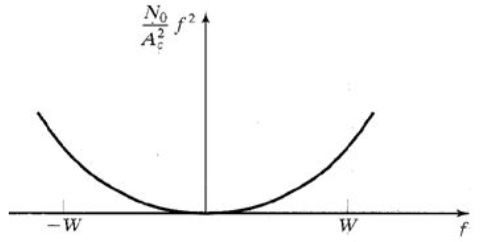


The problem, audible in the treble part of the audio spectrum finds a solution in pre-emphasis and de-emphasis : the volume of treble in augmented before emission and attenued after reception. 

This can be done with a filter like :
$$ H(s) = \frac{1}{1+\tau s}$$

where, $\tau = 50\mu s$ in France. ($75 \mu s$ in USA)

Ressource :
- https://en.wikipedia.org/wiki/Preemphasis_improvement
- https://wiki.gnuradio.org/index.php/FM_Preemphasis
- https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.bilinear.html

__Instruction__

- take a look at the IIR filter provided by scipy and de-amphasis the signal

In [26]:
τ = 50e-6
ω = 1/τ
f = ω / (2*π)
ω, f

(20000.0, 3183.098861837907)

Après avoir étudié la documentation, nous pouvons créer un filtre passe-bas avec les paramètres requis :

In [27]:
bz, az = bilinear([1], [τ, 1], fs=sample_rate) # créer le filtre passe-bas
x_deamphasised = lfilter(bz, az, x_FMdemodulated) # appliquer le filtre au signal démodulé

Nous pouvons également visualiser le filtre obtenu :

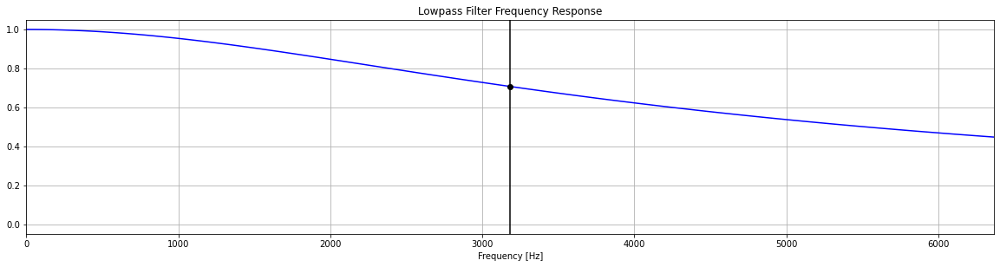

In [28]:
cutoff = f
w, h = freqz(bz, az, fs=sample_rate, worN=8000)
plt.subplot(2, 1, 1)
plt.plot(w, np.abs(h), 'b')
plt.plot(cutoff, 0.5*np.sqrt(2), 'ko')
plt.axvline(cutoff, color='k')
plt.xlim(0, 2*cutoff)
plt.title("Lowpass Filter Frequency Response")
plt.xlabel('Frequency [Hz]')
plt.grid()

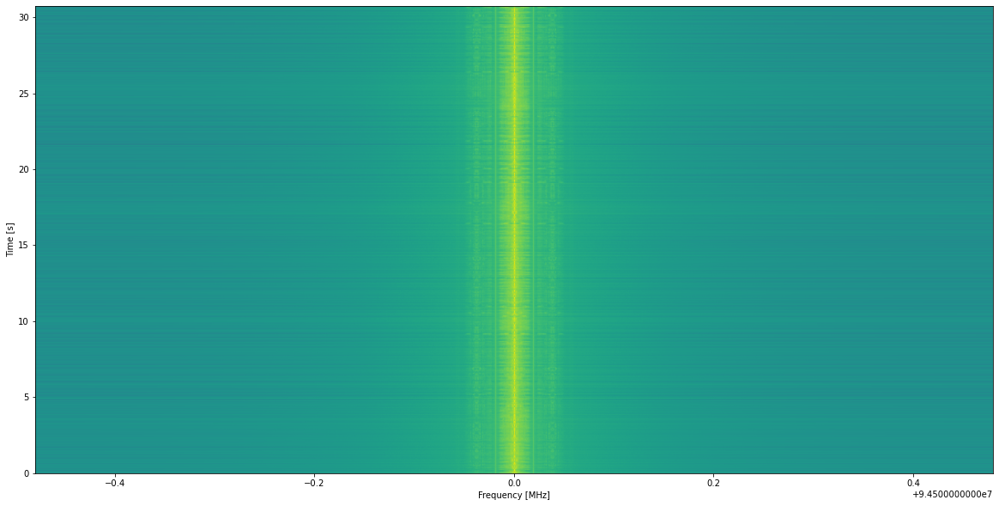

In [29]:
showWaterfall(x_deamphasised, sample_rate, center_freq)

En observant l'image ci-dessus, nous pouvons voir que le signal est devenu encore plus filtré et nous voyons la fréquence centrale plus clairement.  

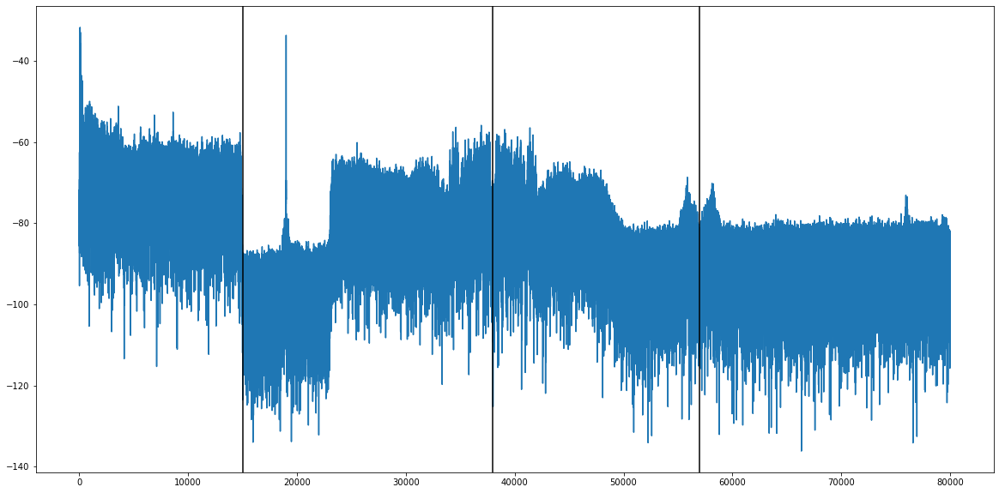

In [30]:
showPSD_FMdemodulated(x_FMdemodulated, sample_rate, axvlines=[15e3, 38e3, 57e3]) # signal démodulé

Nous visualisons le DSP du signal filtré afin de voir les modifications :

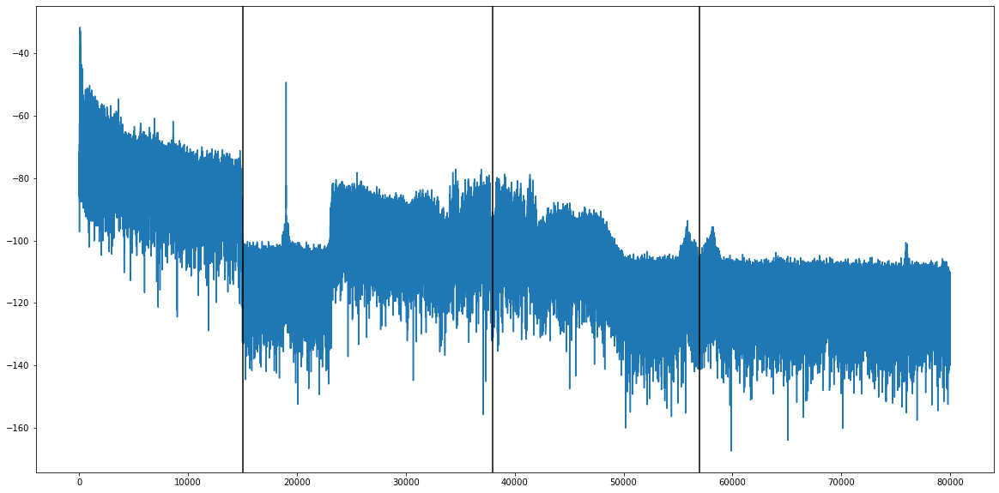

In [31]:
showPSD_FMdemodulated(x_deamphasised, sample_rate, axvlines=[15e3, 38e3, 57e3]) # signal démodulé filtré

Nous observons que nous avons bien réduit le gain du signal en hautes fréquences. Nous pouvons donc vérifier le changement de son :

In [32]:
import IPython.display as ipd
# changer le taux d'échantillonnage
x_32k_resampled_deamph = resample_poly(x_deamphasised, 32, 960)
x_32k_resampled_deamph /= x_32k_resampled_deamph.std()
ipd.Audio(x_32k_resampled_deamph, rate=sample_rate_audio) # load a NumPy array

Après avoir écouté l'audio, nous constatons que les basses fréquences de la chanson sont devenues plus importantes. Cela confirme l'image précédente.

---

## RDS digital data extraction

Let's recall the FM extracted data.

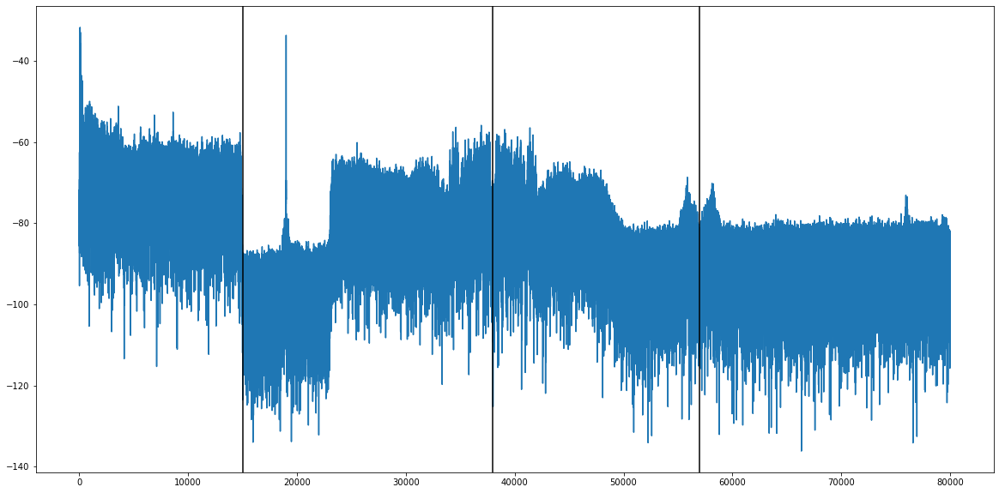

In [33]:
showPSD_FMdemodulated(x_FMdemodulated, sample_rate, axvlines=[15e3, 38e3, 57e3])

__Instruction__

- shift the spectrum arround the RDS data

Cette fois-ci, nous voulons étudier le signal RDS. Pour cela, nous devons décaler le spectre de manière à ce que le point de départ soit 57 kHz.
Pour ce faire, nous utilisons la même "shift" technique que précédemment :

In [34]:
sample_rate_audio_RDS = int(57e3)
Δf = -57e3
t = np.arange(len(x_FMdemodulated))/sample_rate 
x_RDS_shifted = x_FMdemodulated * np.exp(2j*π*Δf*t)

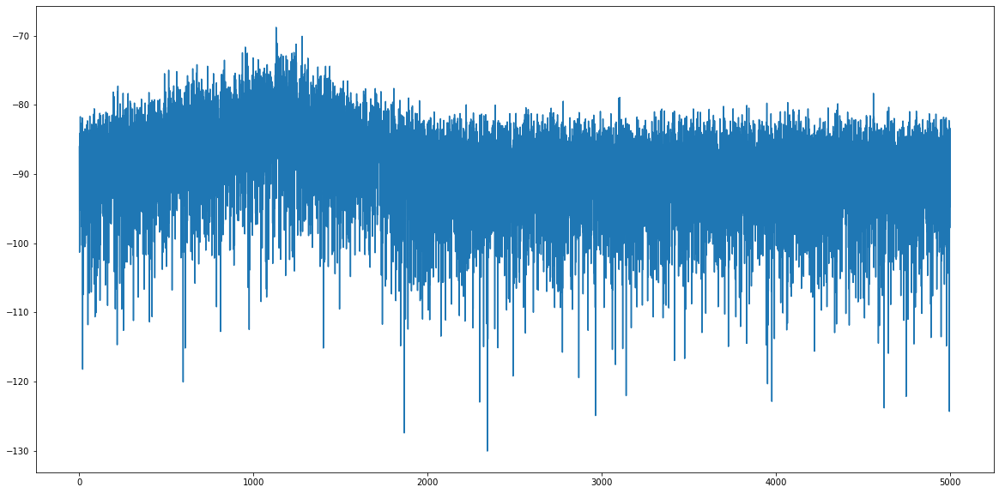

In [35]:
showPSD_FMdemodulated(x_RDS_shifted, sample_rate, axvlines=[], fmax = 5e3)

En regardant l'image ci-dessus, nous pouvons voir que nous avons réussi à déplacer l'axe d'origine. Cette fois-ci, notre spectre commence par le triangle droit du signal RDS.
Pour mieux visualiser le résultat, nous pouvons prendre un spectre de fréquences plus large 

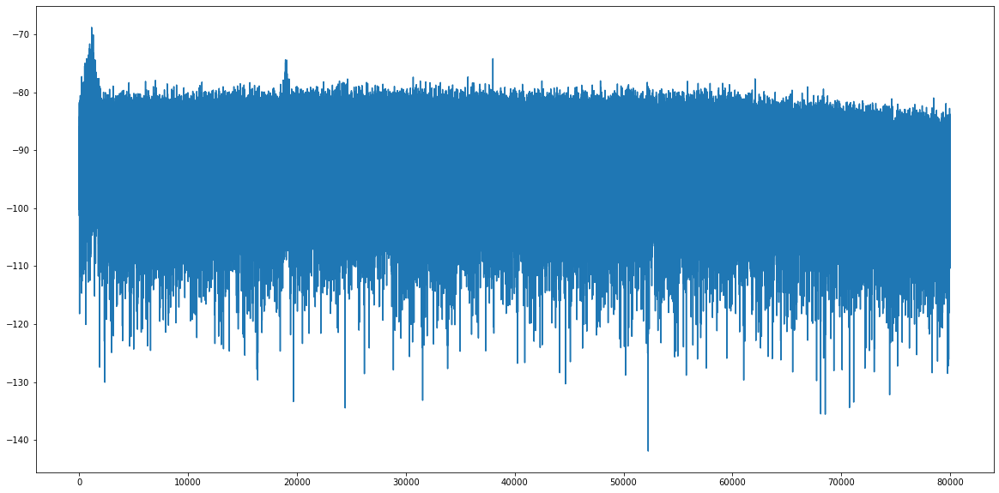

In [36]:
showPSD_FMdemodulated(x_RDS_shifted, sample_rate, axvlines=[])

### Low-pass filtering

__Instructions__

- Understand what is done with `firwin`
- plot the filtered signal using `showPSD_FMdemodulated(x_RDS_lowpass_filtered, sample_rate)`
- What is the cause of the peculiar signal shape you see?

Resources
- https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html

Nous voulons maintenant filtrer le signal RDS, pour cela nous appliquons un filtre numérique à réponse impulsionnelle finie avec 101 coefficients et la fréquence de coupure de 7.5 kHz

In [37]:
# filtre RIF avec 101 coefficients, fréquence de coupure de 7.5 kHz
taps = firwin(numtaps=101, cutoff=7.5e3, fs=sample_rate)

# le produit de la convolution entre le signal RDS et les coefficients calculés
x_RDS_lowpass_filtered = np.convolve(x_RDS_shifted, taps, 'valid')

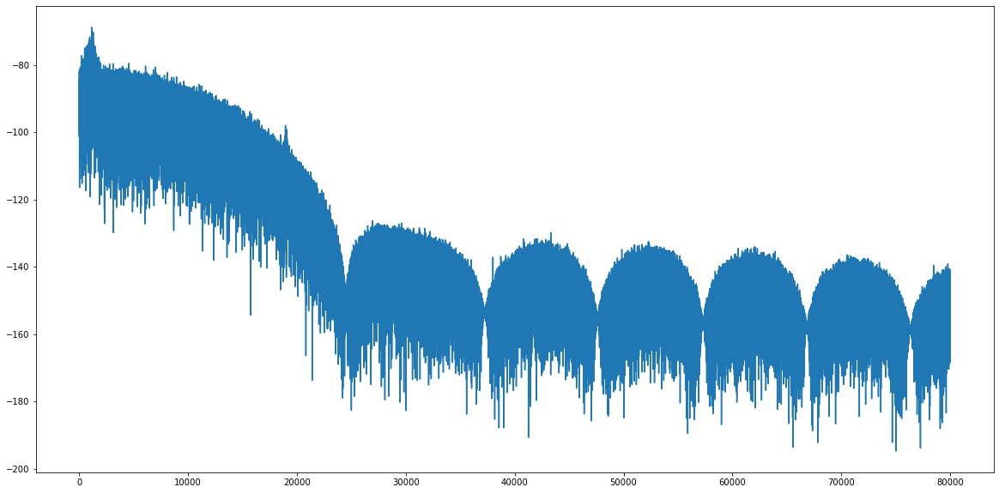

In [38]:
showPSD_FMdemodulated(x_RDS_lowpass_filtered, sample_rate) # signal filtré

Sur l'image ci-dessus, nous reconnaissons la forme du signal filtré par le filtre RIF. En effet, l'atténuation du bruit à haute fréquence ou des interférences dans le signal peut être insuffisante, ce qui se traduit par des bosses dans le signal filtré.

### Resampling

- What is the actual samplerate of `x_RDS_lowpass_filtered`?
- The RDS symbol rate is given in an international norm : 1187.5 symbol/s. Here we want 16 samples by symbol. What should be the new RDS sample rate?
- resample `x_RDS_lowpass_filtered` to `x_RDS_resampled` with the right sample rate.

In [39]:
RDSsymbolerate = 1187.5 # RDS symbole rate
sample_rate_RDS = RDSsymbolerate*16 # nouveau taux d'échantillonnage RDS
print("Nouveau taux d'échantillonnage RDS :", sample_rate_RDS)

Nouveau taux d'échantillonnage RDS : 19000.0


In [40]:
# changer le taux d'échantillonnage
x_RDS_resampled = resample_poly(x_RDS_lowpass_filtered, 19, 960)

### Digital modulation isolation

Here we want to stricly isolate the right-hand side RDS BPSK signal.

Resources
- https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html

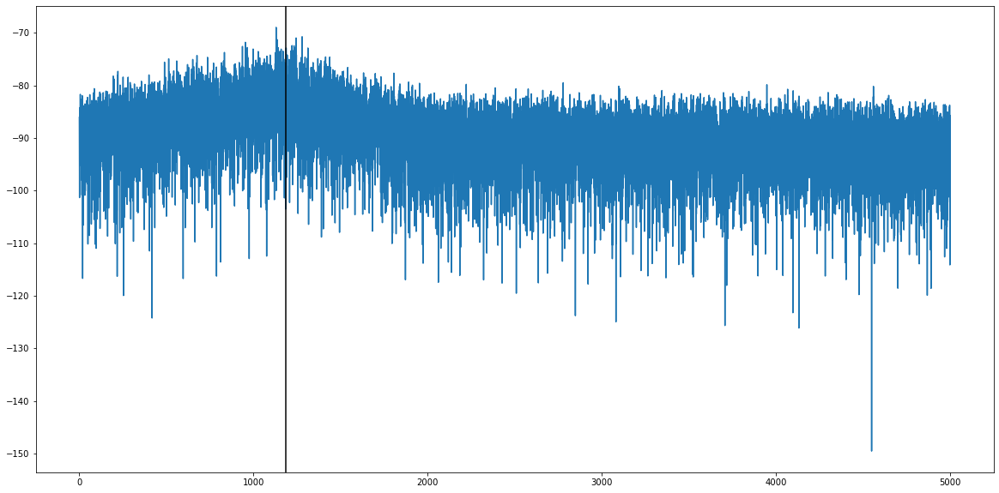

In [41]:
showPSD_FMdemodulated(x_RDS_resampled, sample_rate_RDS, axvlines=[RDSsymbolerate], fmax=5e3)

Cette fois-ci, nous voulons isoler strictement le signal RDS BPSK du côté droit. Pour ce faire, nous augmentons le nombre de coefficients jusqu'à 501 et définissons une largeur de bande passante de 50Hz à 2kHz.   
Nous utilisons également le nouveau taux d'échantillonnage `sample_rate_RDS`.

In [42]:
# filtre RIF avec 501 coefficients, bande passant de 50 Hz à 2 kHz
taps = firwin(numtaps=501, cutoff=[0.05e3, 2e3], fs=sample_rate_RDS, pass_zero=False)

# le produit de la convolution entre le signal RDS rééchantillonné et les coefficients calculés
x_RDS_bandpass_filtered = np.convolve(x_RDS_resampled, taps, 'valid')

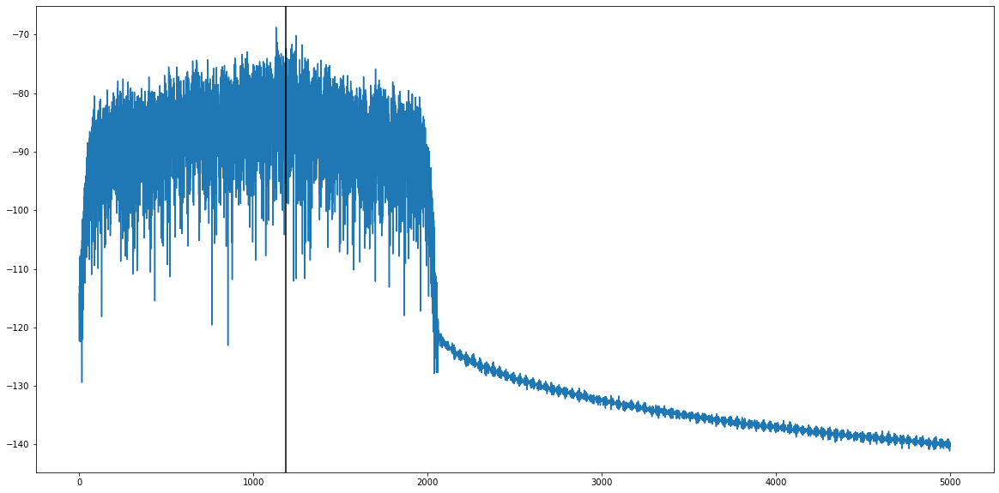

In [43]:
showPSD_FMdemodulated(x_RDS_bandpass_filtered, sample_rate_RDS, axvlines=[RDSsymbolerate], fmax=5e3)

En observant le résultat obtenu, nous constatons que nous avons bien isoler le signal du côté droit. Nous voyons une très forte atténuation du gain à la fréquence de coupure (2kHz). Le filtre répond bien à nos critères.

__Instructions__

- I-Q plot this previous signal. Remarks?


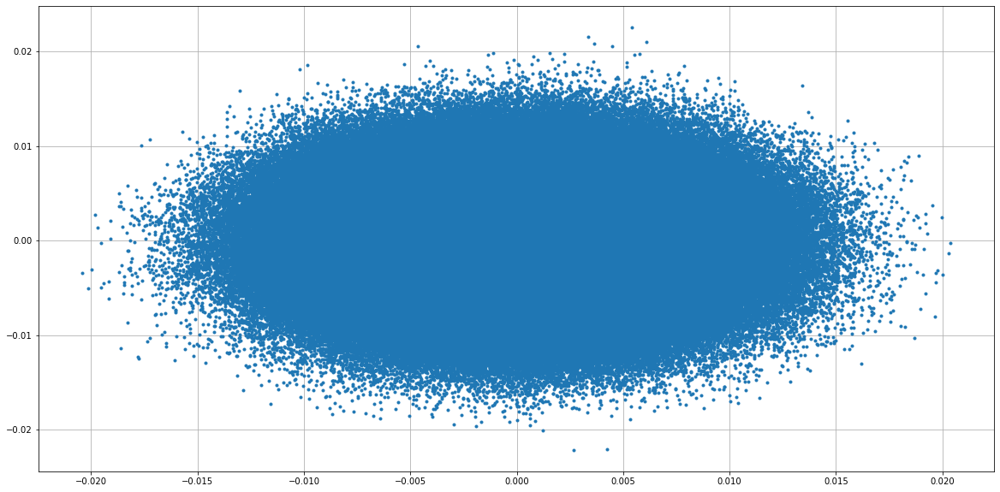

In [44]:
plt.plot(np.real(x_RDS_bandpass_filtered), np.imag(x_RDS_bandpass_filtered), '.')
plt.grid(True)
plt.show()

Let's draw more dynamically what happens :


In [45]:
from ipywidgets import interact, interactive, HBox
def showED(frame) :  
    xx = x[0:frame]
    plt.plot(np.real(xx), np.imag(xx), '.')
    plt.xlim([-0.03, +0.03])
    plt.ylim([-0.03, +0.03])
    plt.grid(True)
    plt.show()

In [46]:
x = x_RDS_bandpass_filtered
w = interactive(showED, frame=(0, len(x)))
display(w)

interactive(children=(IntSlider(value=291674, description='frame', max=583348), Output()), _dom_classes=('widg…

En observant l'évolution du diagramme point par point, nous constatons (surtout au début) que les points suivent la figure $\infty$.   
En effet, en suivant $\infty$, nous observons un changement de phase et d'amplitude, puisque, comme mentionné ci-dessus, les axes représentent l'amplitude, et passer d'un point du plan complexe à un autre est un changement de phase de 180°.

### Symbol interpolation

We want to increase the signal smoothness using 32x oversampling.

__Instructions :__

- resample the `x_RDS_bandpass_filtered` signal, 32x.
- check that we still have a 30s signal.

In [47]:
# changer le taux d'échantillonnage
x_RDS_interpolated = resample_poly(x_RDS_bandpass_filtered, 19*32, 19)

# calculer la durée du signal
len(x_RDS_interpolated)/(19000*32)

30.702526315789473

Nous constatons que le signal a toujours la même durée : 30,7 secondes.

Consider this plot (you can play with the `shift`variable if you wish...) :

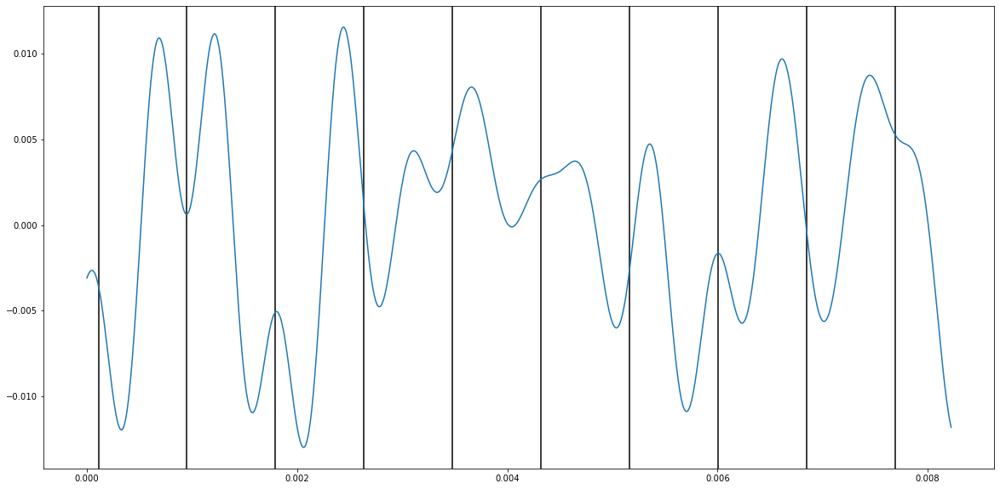

In [48]:
shift = 0.13
a = np.real(x_RDS_interpolated[10000:15000])
t = np.arange(len(a))/(sample_rate_RDS*32)
for i in range(10) : 
    plt.axvline(1/RDSsymbolerate*(i + shift), color='k')
plt.plot(t, a)

__Instructions__

- seeing this signal, what digital modulation do you think is used?
- What constellation diagram do you expect? 
- Regarding the animated graph (and the static one that follows, too), what problem do you think is to blame ?

Après avoir modifié `shift` dans le code précédent, nous pouvons clairement voir les différents bits. 
Nous pouvons dire que l'amplitude reste plus ou moins la même, cependant nous constatons un changement de phase, donc c'est la modulation `BPSK` (2-PSK) qui est utilisée.  
Pour la modulation `BPSK`, nous attendons le diagramme de constellation suivant :

<div>
<img src="images/bpsk.png" width="300"/>
</div>

Nous pouvons constater que le diagramme obtenu est différent de celui attendu. Cela peut être dû à du bruit dans le signal ou à un mauvais récepteur.

---
## Full demodulation (for testing purpose)

Use it to test if your IQ signal does carry RDS Info.


In [49]:
from libADTrans import *
fullRDS(x_RDS_bandpass_filtered, x_RDS_interpolated, sample_rate)

Sync State Detected
Lost Sync (Got  40  bad blocks on  50  total)
Sync State Detected
Still Sync-ed (Got  6  bad blocks on  50  total)
Still Sync-ed (Got  6  bad blocks on  50  total)
Still Sync-ed (Got  6  bad blocks on  50  total)
Still Sync-ed (Got  10  bad blocks on  50  total)
Still Sync-ed (Got  8  bad blocks on  50  total)
Still Sync-ed (Got  8  bad blocks on  50  total)
Still Sync-ed (Got  12  bad blocks on  50  total)
Still Sync-ed (Got  19  bad blocks on  50  total)
Still Sync-ed (Got  11  bad blocks on  50  total)
Still Sync-ed (Got  18  bad blocks on  50  total)
Still Sync-ed (Got  14  bad blocks on  50  total)
Still Sync-ed (Got  22  bad blocks on  50  total)
Still Sync-ed (Got  14  bad blocks on  50  total)
Still Sync-ed (Got  22  bad blocks on  50  total)
Still Sync-ed (Got  19  bad blocks on  50  total)
Still Sync-ed (Got  21  bad blocks on  50  total)
Still Sync-ed (Got  27  bad blocks on  50  total)
Still Sync-ed (Got  24  bad blocks on  50  total)
Still Sync-ed (Got 

Avec la fonction utilisée nous restaurons l'information RDS bit par bit.  
Nous pouvons constater que le message final est tout à fait conforme à la réalité, parce que nous avons enregistré une partie de la chanson `Vem Dancar Kuduro` en écoutant la station radio `Max Radion`.

---

## Stereophonic audio extraction

__Intructions__

- Have fun! But, begin the following RDS part before...  
  
Let's recall the FM extracted data.

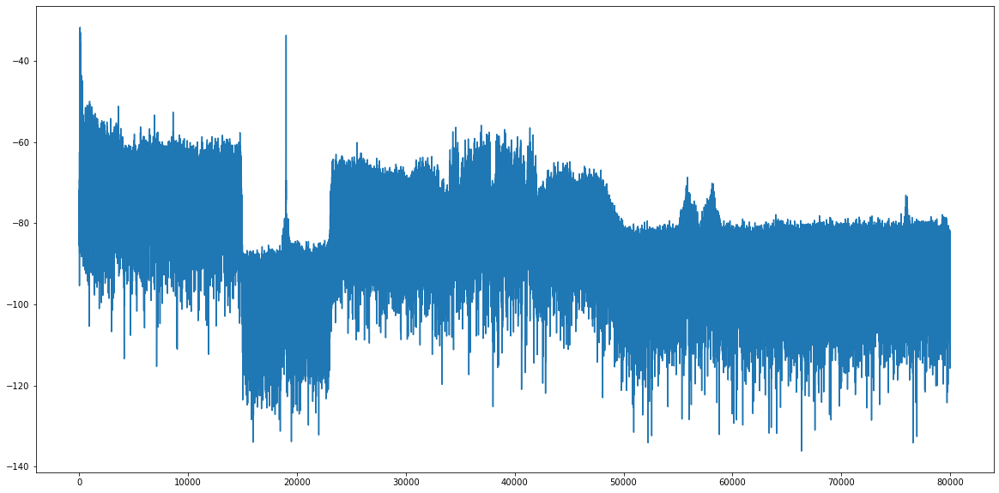

In [50]:
showPSD_FMdemodulated(x_FMdemodulated, sample_rate, axvlines=[])

Afin de pouvoir étudier la partie stéréo du signal, nous devons déplacer le pilote à 38kHz, entre les deux bandes latérales.  
Pour le faire nous :  
- isolons la composante de la fréquence porteuse à l'aide du filtre passe-bande
- déplaçons cette composante à la fréquence souhaitée en la multipliant par un exposant complexe
- ajoutons la composante décalée au signal original

In [51]:
from scipy.signal import firwin, filtfilt

# définir les paramètres du filtre
order = 501
cutoff_low = 18.99e3
cutoff_high = 19.01e3
fs = sample_rate

# élaborer le filtre passe-bande
taps = firwin(order, [cutoff_low, cutoff_high], pass_zero=False, fs=fs)

# appliquer le filtre au signal pour isoler la composante de la fréquence porteuse
x_carrier = filtfilt(taps, [1], x_FMdemodulated)

# utiliser la même "shift" technique que précédemment
f_shift = 19e3
t = np.arange(len(x_carrier))/fs
x_carrier_shifted = x_carrier*np.exp(2j*np.pi*f_shift*t)

# ajouter la composante de fréquence porteuse décalée au reste du signal
x_FMdemodulated_stereo = x_FMdemodulated + x_carrier_shifted

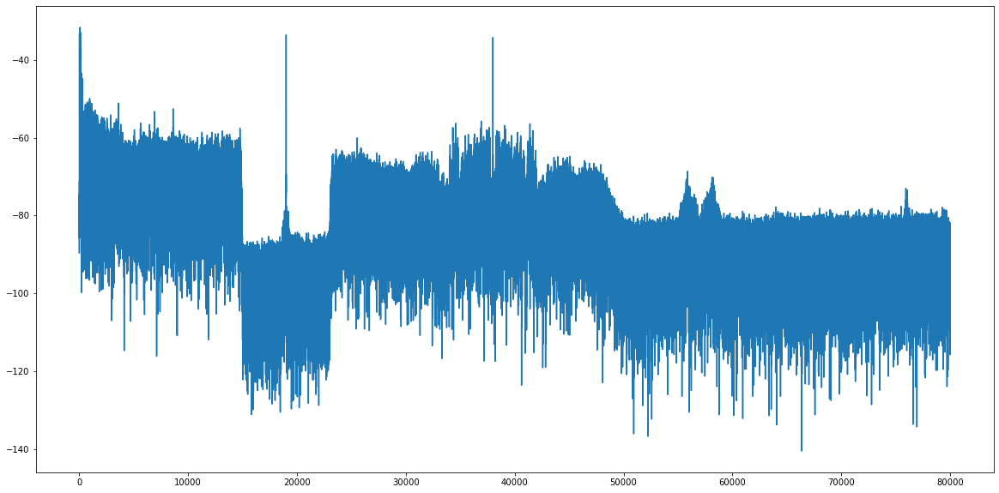

In [52]:
showPSD_FMdemodulated(x_FMdemodulated_stereo, sample_rate, axvlines=[])

Nous voulons maintenant obtenir deux canaux stéréo, un canal gauche (G) et un canal droit (D). Nous savons que :
- audio mono : G + D
- audio stéréo : G - D 

Donc, en additionnant les deux signaux, nous obtenons 2G, et en réalisant la différence entre les deux signaux, nous obtenons 2D

In [53]:
# décaler le signal FM de 38 kHz
delta_f = 38e3
t = np.arange(len(x_FMdemodulated_stereo))/sample_rate
FM_shifted = x_FMdemodulated_stereo*np.exp(2j*np.pi*delta_f*t)

# calculer les canaux gauche et droit
L = (x_FMdemodulated_stereo + FM_shifted)/2
R = (x_FMdemodulated_stereo - FM_shifted)/2

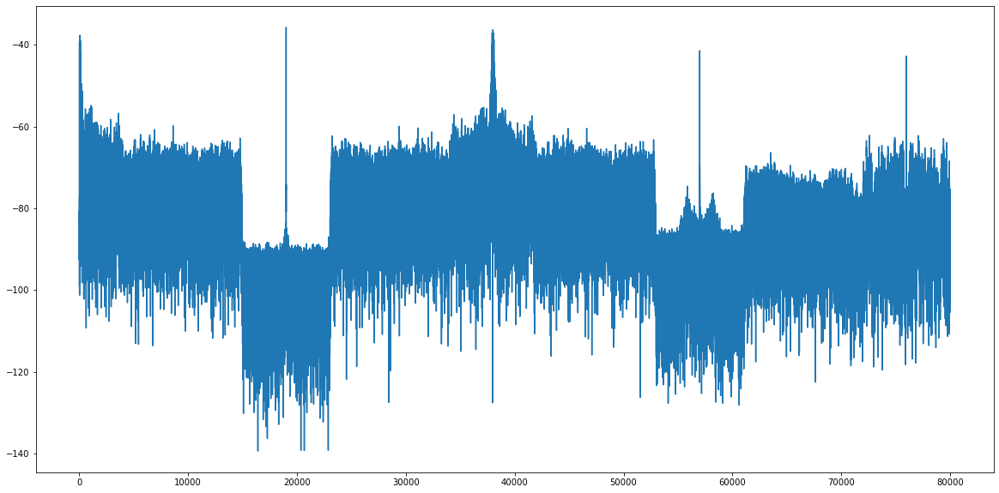

In [54]:
showPSD_FMdemodulated(L, sample_rate, axvlines=[]) # canal gauche

In [55]:
len(L), len(R)

(29499746, 29499746)

Nous n'avons pas réussi à obtenir de l'audio en utilisant la même méthode que précédemment. Nous avons donc trouvé cet exemple de combinaison de deux canaux et d'enregistrement du fichier audio final au format `.wav`.

In [56]:
import struct
import numpy as np

# convertir les signaux L et R en flottants 32 bits normalisés
L_norm = L.real.astype(np.float32) / np.max(np.abs(L))
R_norm = R.real.astype(np.float32) / np.max(np.abs(R))

# créer un tableau 2D contenant les signaux L et R
LR = np.column_stack((L_norm, R_norm))

# écrire le fichier audio stéréo
with open('audio_stereo.wav', 'wb') as f:
    channels = 2
    bit_depth = 16
    bytes_per_sample = bit_depth // 8
    bytes_per_second = sample_rate * channels * bytes_per_sample
    block_align = channels * bytes_per_sample

    f.write(b'RIFF')
    f.write(struct.pack('<I', 36 + LR.nbytes))
    f.write(b'WAVE')
    f.write(b'fmt ')
    f.write(struct.pack('<IHHIIHH', 16, 1, channels, int(sample_rate),
                        int(bytes_per_second), int(block_align), bit_depth))
    f.write(b'data')
    f.write(struct.pack('<I', LR.nbytes))

    # écrire les données audio stéréo
    for i in range(LR.shape[0]):
        for j in range(LR.shape[1]):
            sample = int(round(LR[i, j] * (2**(bit_depth-1) - 1)))
            f.write(struct.pack('<h', sample))

Après avoir écouté le fichier audio obtenu, nous remarquons qu'il est cette fois-ci plus "surround" (le son est réparti dans l'espace). Nous pouvons donc dire que nous avons bien obtenu le son stéréo .